In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
style.use('fivethirtyeight')
import helper # my function that i added
import missingno as msno

# Makes figures a higher resolution. Better for saving.
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['savefig.dpi'] = 300

In [2]:
colors = ["#FF0B04", "#F1BE48",
           "#B9975B", "#8B5B29",
           "#524727",
         ]
sns.set_palette(sns.color_palette(colors))
sns.color_palette()

[(1.0, 0.043137254901960784, 0.01568627450980392),
 (0.9450980392156862, 0.7450980392156863, 0.2823529411764706),
 (0.7254901960784313, 0.592156862745098, 0.3568627450980392),
 (0.5450980392156862, 0.3568627450980392, 0.1607843137254902),
 (0.3215686274509804, 0.2784313725490196, 0.15294117647058825)]

In [3]:
# loading and splitting data
housing = pd.read_csv('ames_housing_latlong.csv', index_col=0)
housing = housing[(housing['SaleCondition'] == 'Normal') | (housing['SaleCondition'] == 'Partial')].reset_index(drop=True)
train = housing[(housing['latitude']>=41.9)&(housing['longitude']<=-93.59)]

# converting all similar mappings together
# most popular mapping
cat_ordinal_features = [
    'GarageQual','GarageCond',
    'FireplaceQu',
    'KitchenQual',
    'ExterQual','ExterCond',
    'BsmtQual','BsmtCond',
    'HeatingQC'
    ]
cat_ordinal_dict = {'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)
# now just unique mappings
# BsmtExposure
cat_ordinal_features = [
    'BsmtExposure'
]
cat_ordinal_dict = {'No':1,'Mn':2,'Av':3,'Gd':4}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)
#(Niki) Updated values in mapping dictionary
# Functional
cat_ordinal_features = [
    'Functional'
]
cat_ordinal_dict = {'Sal':1,'Sev':2,'Maj2':3,'Maj1':4,
                    'Mod':6,'Min2':8,'Min1':9,'Typ':10}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)
# PoolQC ((Niki) Suggest Dropping in future and replace by _has_Pool binary feature)
cat_ordinal_features = [
    'PoolQC'
]
cat_ordinal_dict = {'Fa':1,'TA':2,'Gd':3,'Ex':4}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)
# (JH) Garage Finish
cat_ordinal_features = [
    'GarageFinish'
]
cat_ordinal_dict = {'Unf':1,'RFn':2,'Fin':3}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)

# (JH) Alley
cat_ordinal_features = [
    'Alley'
]
cat_ordinal_dict = {'Grvl':1,'Pave':2}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)

# (JH) PavedDrive
cat_ordinal_features = [
    'Alley'
]
cat_ordinal_dict = {'P':1,'Y':2}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)
# (AA) LotFrontage imputed as (coefficient from dict) * sqrt(LotArea)
LotFrontage_dict = {'1Fam':0.7139, 'TwnhsE':0.5849, 'Twnhs':0.5227, 'Duplex':0.7725, '2fmCon':0.6922}
train.loc[train['LotFrontage'].isna(), 'LotFrontage'] = train.loc[train['LotFrontage'].isna(), :].apply(
    lambda x: LotFrontage_dict[x['BldgType']]*np.sqrt(x['LotArea']), axis=1
)

# (Niki) Utilities
cat_ordinal_features = [
    'Utilities'
]
cat_ordinal_dict = {'ELO':1,'NoSeWa':2,'NoSewr':3,'AllPub':4}
train = helper.convert_cat_ordinal_vars_to_num(train,
                                               cat_ordinal_features,
                                               cat_ordinal_dict)


############################################################
# weirdest nas. lot frontage. probably worth removing
# not dealing with them out of expediance.
# (AA) Removing LotFrontage here because imputed above.
drop_now_but_look_at_later = ['MasVnrArea','GarageYrBlt']
train.drop(drop_now_but_look_at_later, axis=1,inplace = True)

# NAs that have meaning based on data dicitonary.
# nas are "None" categorical value
na_none_features = ['MiscFeature','BsmtFinType1','BsmtFinType2',
                   'GarageType', 'MasVnrType']
for na_none_feature in na_none_features:
    train[na_none_feature] = train[na_none_feature].fillna(value = 'None')

# nas are 0 numerical value
# (AA) Changed na_none_feature to na_zero_feature for readability. 
# (AA) Added 'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF' to the list.
na_zero_features = ['BsmtFullBath','BsmtHalfBath','GarageFinish','Alley', 
                   'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
for na_zero_feature in na_zero_features:
    train[na_zero_feature] = train[na_zero_feature].fillna(value = 0)
    
############################################################
# second group of features that have problems that I need help solving.
cols_na = train.loc[:,train.isna().any(axis=0)].columns.to_list()
cols_na

#############################################################
# (JH) Julie's specific additions
# (HW) Consider making this more generalizable
# 1. Replacing two values of GarageType to None

train.loc[train['PID'] == 903426160,'GarageType'] = 'None'
train.loc[train['PID'] == 910201180,'GarageType'] = 'None'

#####
# (Niki) Replace 'Pool Area' feature with binary '_has_Pool'. Drop PoolQC
#train['_has_Pool'] = [1 if row != 0 else 0 for row in train['PoolArea']]

# (Niki) Replace null value for Electrical with most common value 'SBrkr'
train['Electrical'] = train['Electrical'].fillna(value = 'SBrkr')

loca = train

/Users/haydenlw4/Desktop/Pie/machine_project/Ames-Housing-Analysis/Hayden/helper.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = df[column].map(mapping_dict).fillna(value=0)
/Users/haydenlw4/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
/Users/haydenlw4/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4901: SettingWithCopyWarning: 
A value is trying to be s

In [4]:
housing = pd.read_csv('ames_housing_latlong.csv', index_col=0)
loca = housing[(housing['latitude']>=41.9)&(housing['longitude']<=-93.59)]

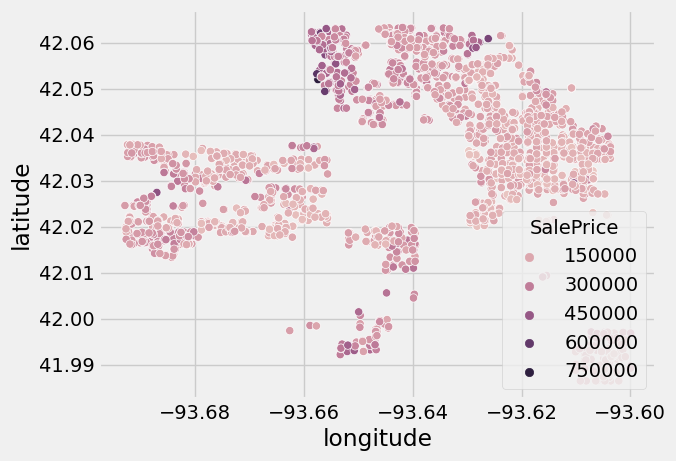

In [5]:
g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',
                    hue='SalePrice',)
plt.show()

<ipython-input-6-6a4268980311>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  graph_df['SalePrice_bins'] = pd.qcut(graph_df['SalePrice'],


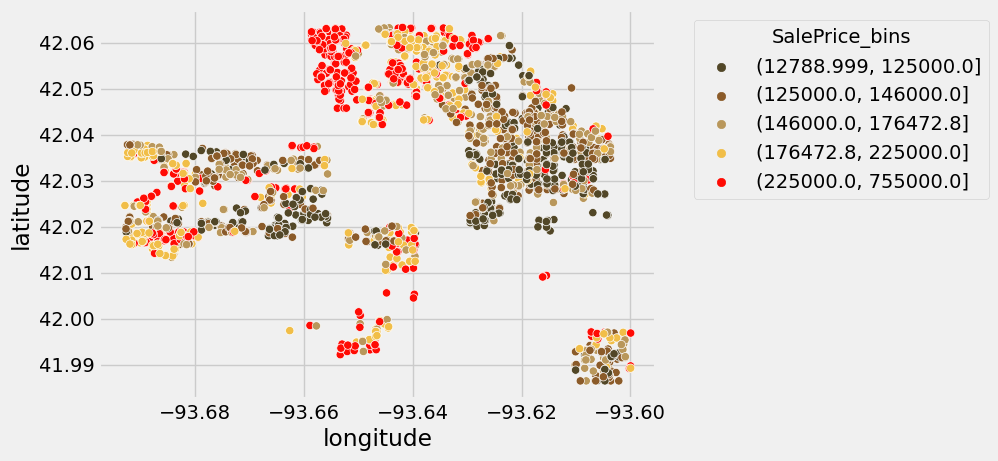

In [6]:
graph_df = loca
graph_df['SalePrice_bins'] = pd.qcut(graph_df['SalePrice'],
                              q=5)

g = sns.scatterplot(data = graph_df, y = 'latitude',x = 'longitude',
                    hue='SalePrice_bins',palette = colors[::-1])
sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))
plt.show()

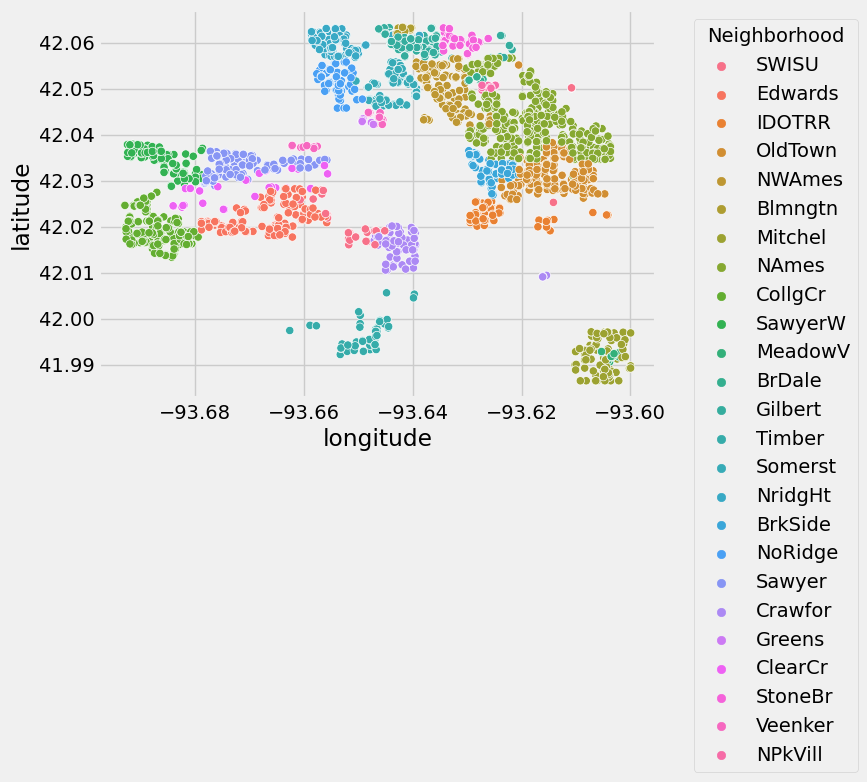

In [7]:
g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue='Neighborhood')
sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))


plt.show()

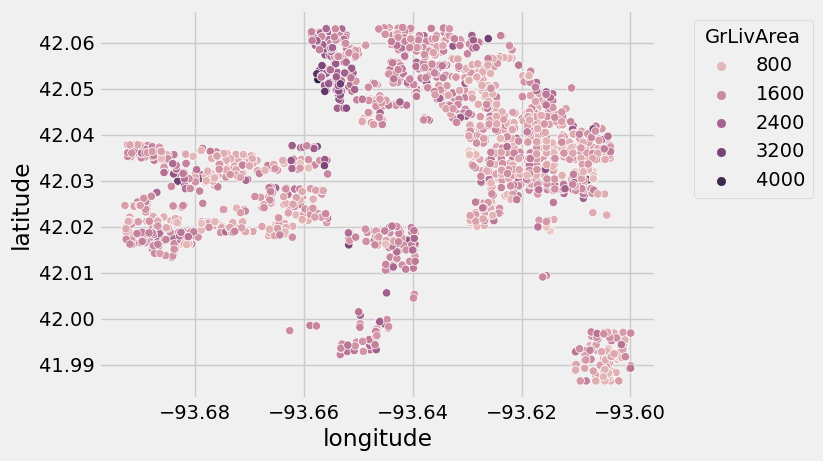

In [8]:

g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue='GrLivArea',)
sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))


plt.show()

<ipython-input-9-59360ddf49ac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  graph_df['bins'] = pd.qcut(graph_df['GrLivArea'],


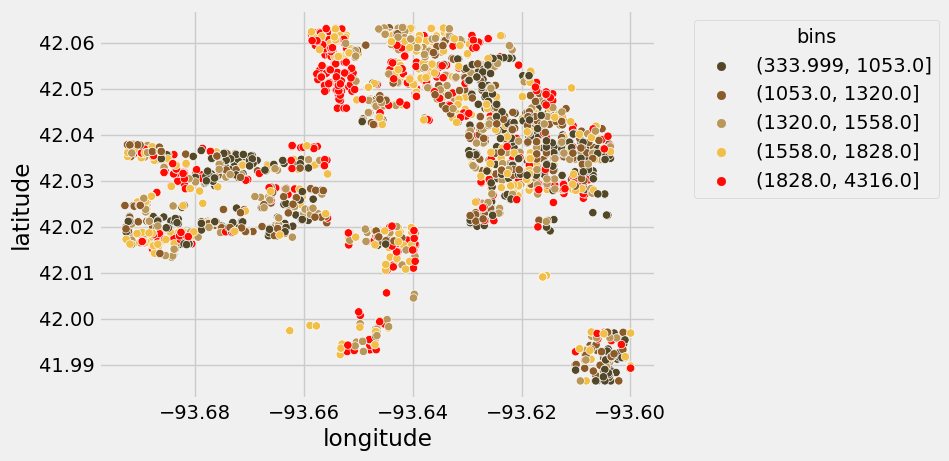

In [9]:
graph_df = loca
graph_df['bins'] = pd.qcut(graph_df['GrLivArea'],
                              q=5)
g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue='bins',
                   palette = colors[::-1])
sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))


plt.show()


<ipython-input-10-1794c71016eb>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  graph_df['bins'] = pd.qcut(graph_df['SalePrice'],
<ipython-input-10-1794c71016eb>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  graph_df['bins'] = pd.qcut(graph_df['GrLivArea'],


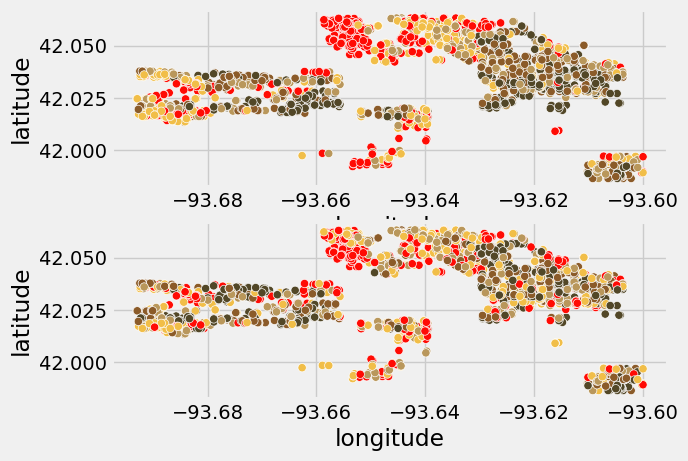

In [10]:
f, axs = plt.subplots(2,1)
graph_df = loca
graph_df['bins'] = pd.qcut(graph_df['SalePrice'],
                              q=5)
g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue='bins',
                   palette = colors[::-1],ax=axs[0],legend=False)
# sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))

graph_df = loca
graph_df['bins'] = pd.qcut(graph_df['GrLivArea'],
                              q=5)
g2 = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue='bins',
                   palette = colors[::-1],ax=axs[1],legend=False)
# sns.move_legend(g2,loc = "upper left",bbox_to_anchor=(1.05, 1))


plt.show()

In [11]:
loca.columns

Index(['PID', 'GrLivArea', 'SalePrice', 'MSSubClass', 'MSZoning',
       'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond

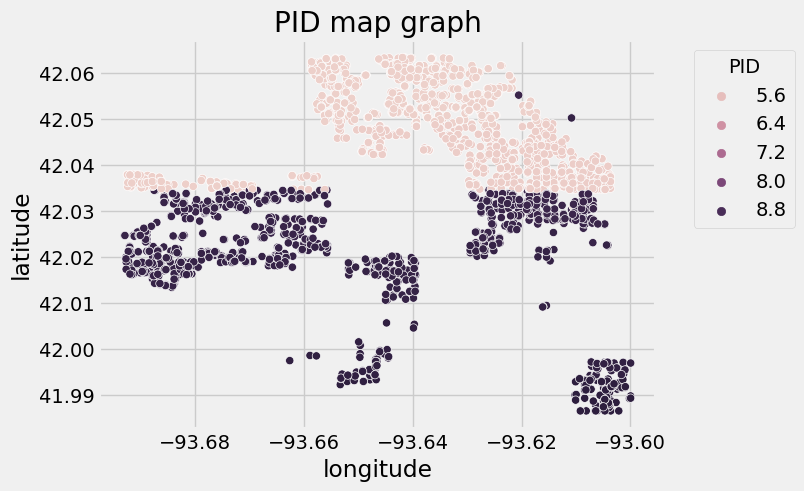

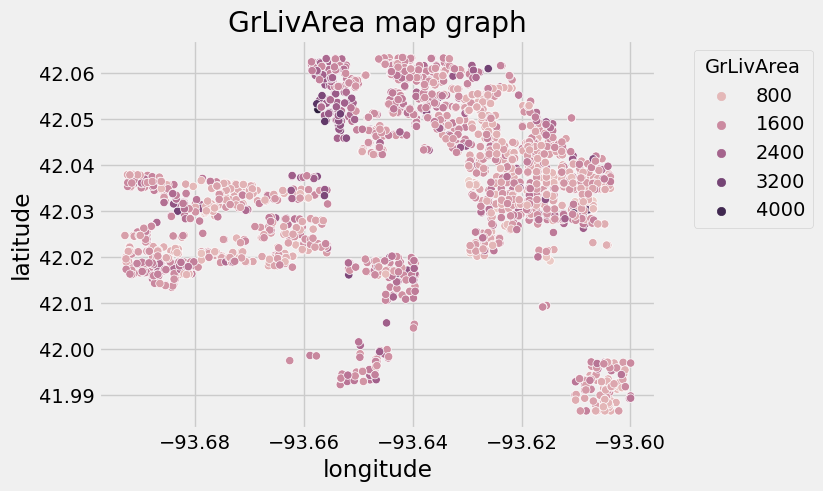

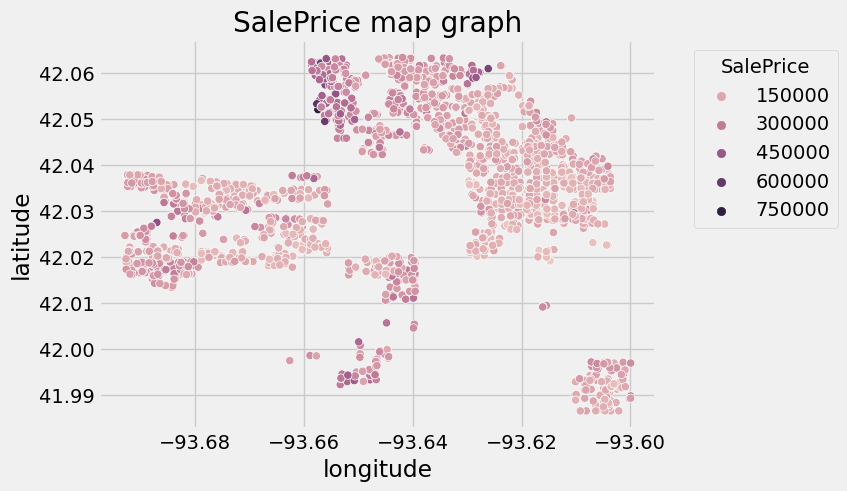

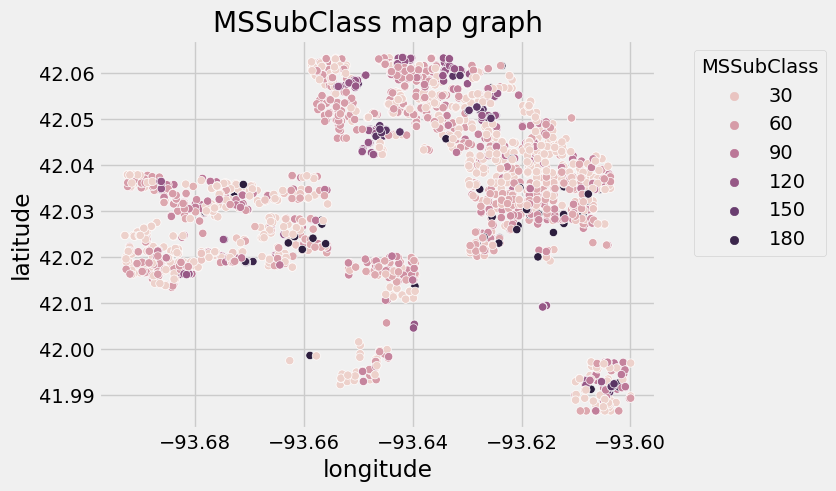

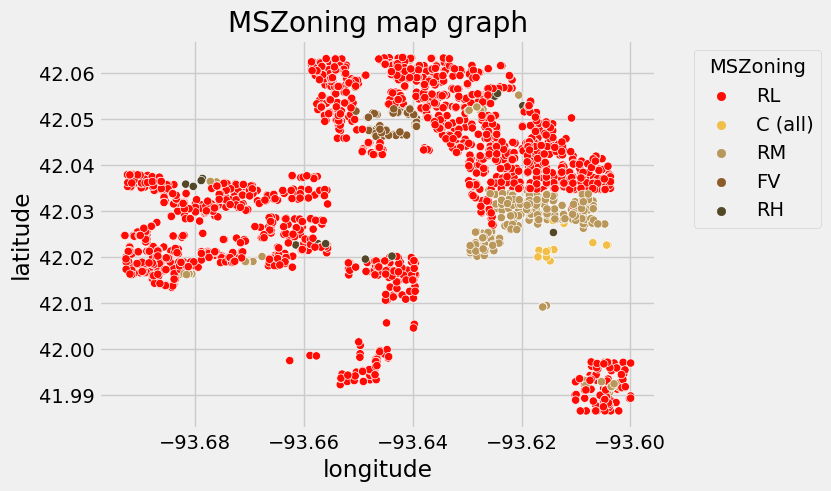

...

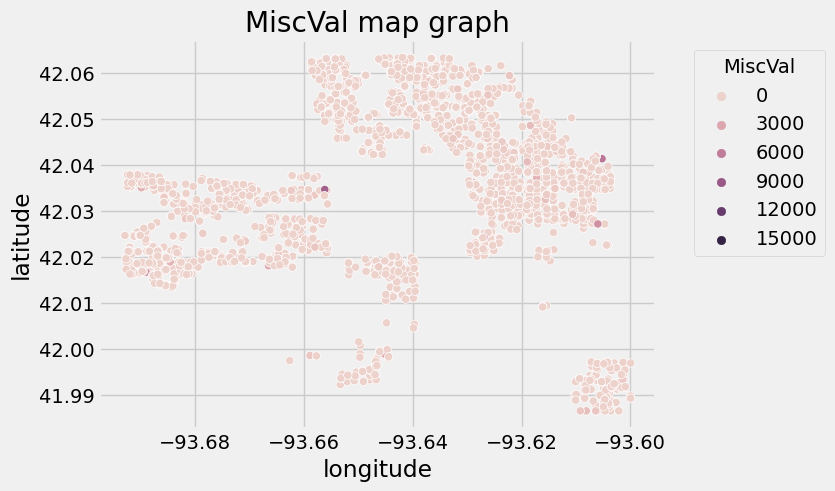

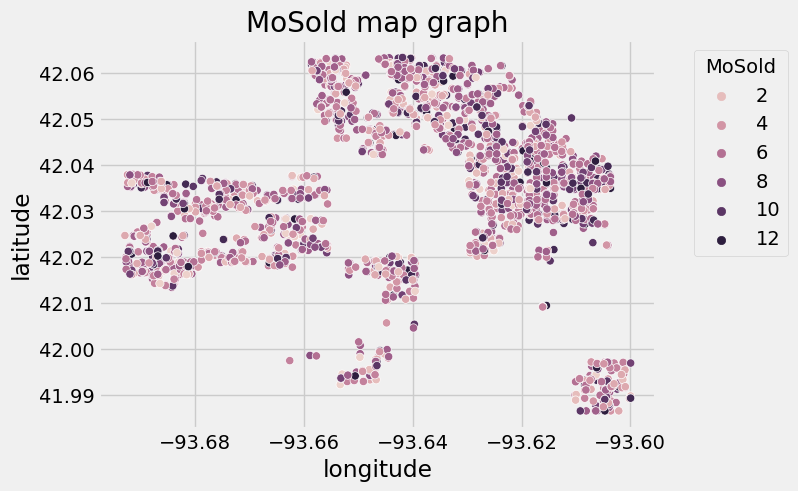

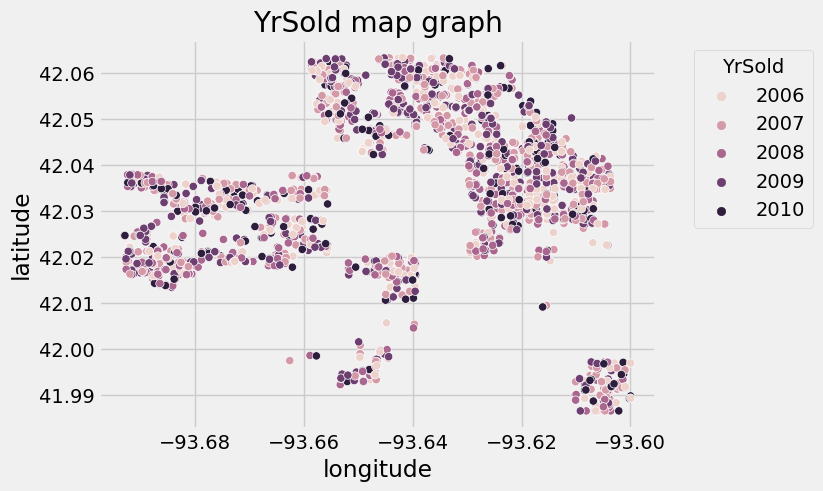

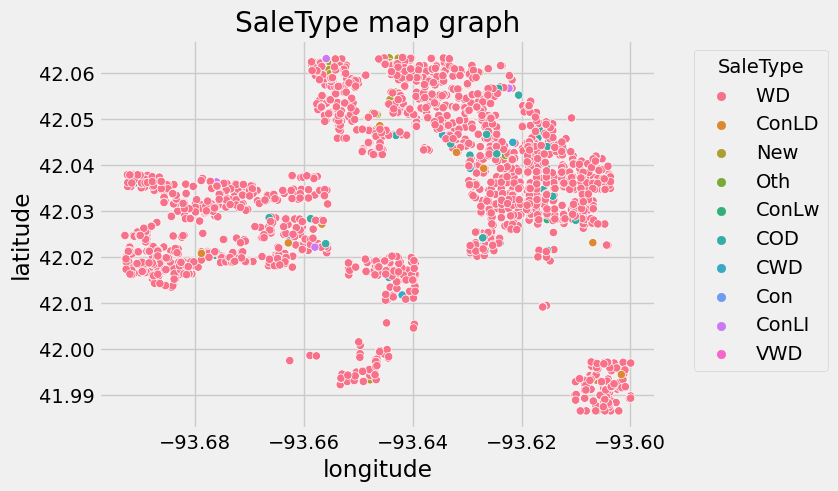

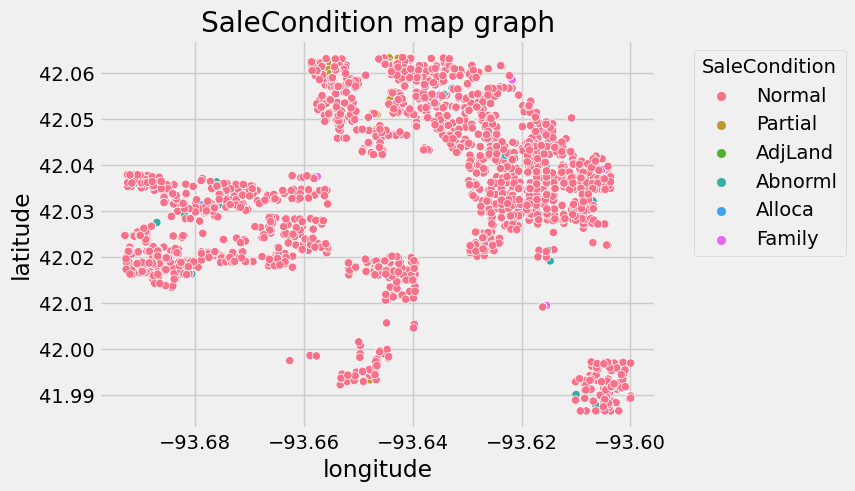

In [13]:
cols = ['PID', 'GrLivArea', 'SalePrice', 'MSSubClass', 'MSZoning',
       'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC',
       'Fence', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold', 'SaleType',
       'SaleCondition']
for col in cols:
    g = sns.scatterplot(data = loca, y = 'latitude',x = 'longitude',hue=col,)
    sns.move_legend(g,loc = "upper left",bbox_to_anchor=(1.05, 1))
    plt.title(f"{col} map graph")



    plt.show()

In [15]:
loca.YrSold.unique()

array([2010, 2009, 2007, 2008, 2006])

what elementary schools exist
Edwards Elementary School
Fellows Elementary School
Meeker Elementary School
Kate Mitchell Elementary School
Abbie Sawyer Elementary School